# Distracted Driving Detection - Final Report
**Computer Vision Course, Masters In Data Science, UC Berkeley, Fall 2022**

**by** Ram Senthamarai, Hoon Kim, Kai Ying, Dmitry Baron

CDC reported[<sup>1</sup>](#cite_cdc) that 3,100 were killed and 424,000 were injured in crashes involving a distracted driver in 2019. Dashcam has become a common and mature technology. Similarly, dash mounted smart phones with cameras are also very prevalent. Can we leverage videos/images from dashcams or dash mounted smart phones to detect distracted driving and use that to reduce the risk of driver distraction, improving public driving safety?

The main objective of our project is to design a classifier to identify ten types of driver behavior:

    1) Safe Driving
    2) Texting (right)
    3) Phone Call (right)
    4) Texting(left)
    5) Phone Call(left)
    6) Fiddling With Console
    7) Drinking
    8) Reaching Back
    9) Fixing Looks
    10) Conversing.

## Notebook Setup
Prerequisites for this notebook is that all the features have been extracted and saved to the disk by running all cells in the [EDA Notebook](Run_eda.ipynb) notebook. It also needs that all depedencies are installed. Please follow the steps in [Readme](README.md) for setting up dependencies. Further, it is advisable to use GPU for this notebook. Finally, we start with importing required dependencies.

In [1]:
# Environment Config & Library Imports
%load_ext autoreload
%autoreload 2
%matplotlib inline

from collections import defaultdict
from enum import Enum, IntEnum
from utilmethods import create_output_folders, check_torch_mps_device, make_torch_deterministic
import shutil
from torch.utils.data import DataLoader
from pathlib import Path
from IPython.display import Image
from IPython.display import display, Image, HTML

# Suppress deprecation and future warnings
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=DeprecationWarning)
# warnings.simplefilter(action='ignore', category=RuntimeWarning)

# Open source imports
import cv2 as cv
import enums
import matplotlib
import matplotlib.ticker as ticker
import numpy as np
import os
import pandas as pd
import pickle
import seaborn as sns
import time
import torch
from matplotlib import pyplot as plt
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV, validation_curve
from sklearn import metrics
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from scipy.stats import loguniform
from torch import nn
from torchsummary import summary
from torchvision import transforms
print (f'torch.__version__: {torch.__version__}')
from tqdm.notebook import tqdm
from sklearn.ensemble import RandomForestClassifier
from hyperopt import STATUS_OK,rand, tpe, Trials, fmin, hp
from hyperopt.early_stop import no_progress_loss
from sklearn.model_selection import cross_val_score

from tensorflow import keras
from tensorflow.keras.layers import ZeroPadding2D, Conv2D, MaxPooling2D, Flatten, Dense, Dropout, Input
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras import regularizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint

# Custom modules
import configuration
import customdataset
import eda_helpers
import feature_helpers
import models
import transformers
import viz
import model_analyzers

# Variables
device = 'cpu'
config = configuration.Configuration()
face_config = configuration.FaceConfig(config)
pose_config = configuration.PoseConfig(config)
vizualizer = viz.Vizualizer(config, face_config, pose_config, tqdm=tqdm)
feature_extractor = feature_helpers.FeatureExtractor(config, face_config, 
                                                     pose_config, tqdm)

LABELS_TO_INCLUDE = config.class_dict.keys()
IMAGE_TYPES = [enums.ImageTypes.ORIGINAL, 
               enums.ImageTypes.POSE_ANNOTATED, 
               enums.ImageTypes.FACE]
FEATURES = [enums.FeatureType.CNN, enums.FeatureType.KEYPOINTS, 
            enums.FeatureType.HOG]

torch.__version__: 1.13.0


2022-12-18 15:15:36.407526: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


## Understanding The Data
The dataset is provided from a [Kaggle competition](https://www.kaggle.com/competitions/state-farm-distracted-driver-detection/data) hosted by State Farms. Kaggle provides both the training and testing dataset. However, given that the testing dataset does not have any class label associated with them, for the purpose of this class project, we decided to exclude the test set given.

The training dataset consists of a total of 22,424 images captured in a fixed angle from an in-car dashcam. These images are classified into 10 types of driving behavior as mentioned above. Each image is a 640 x 480 JPEG image with RGB color space.


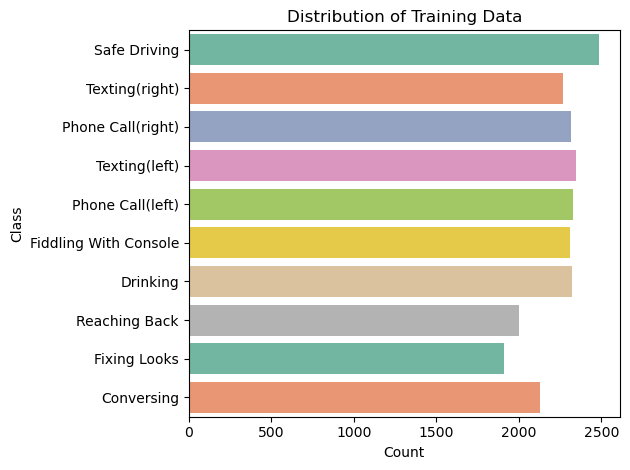

In [2]:
# Distribution of Training Data
vizualizer.plot_raw_class_counts()

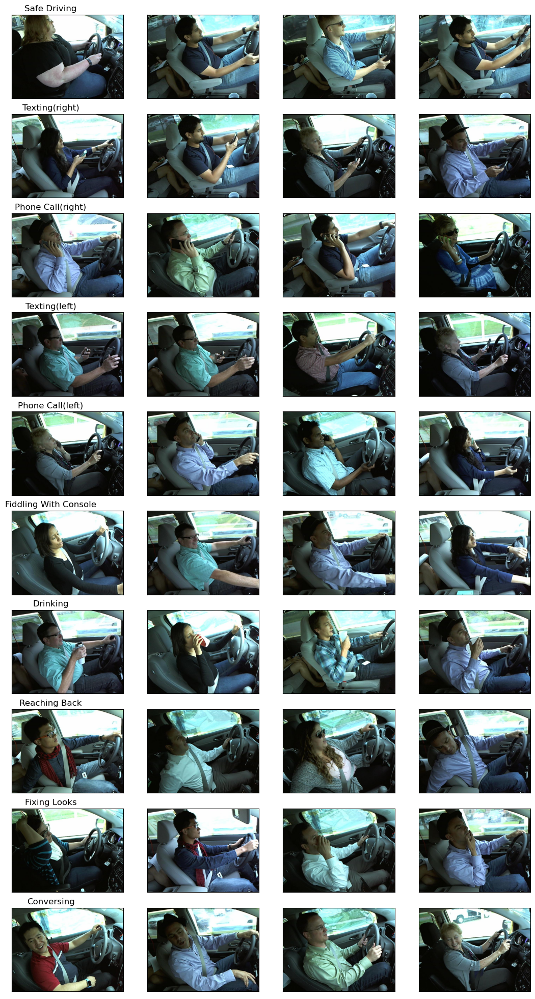

In [3]:
# Display Sample Images
vizualizer.plot_samples(4)

## Feature Engineering
Our initial intuition was that most of the behaviors in our classes could be distinguished by the difference in the driver’s head orientation, hand position, and body orientation. For example, fiddling with the center console usually involves a driver stretching their right arm and having their head slightly lower and towards the right, trying to press buttons on the console. Since the images have other irrelvant pixels capturing the car and its sorroundings, we decided to isolate the driving using existing pre-trained models. After evaluating multiple options available, we decided on using:
* [Multi-task Cascaded Convolutional](https://github.com/ipazc/mtcnn#zhang2016) Networks model[<sup>2</sup>](#cite_mtcnn) to identify and extract faces.
* Google's [Movenet model](https://www.tensorflow.org/hub/tutorials/movenet) which is based on MobileNetV2[<sup>3</sup>](#cite_mobilenet) for pose extraction
* TensorFlow's [BodyPix model](https://blog.tensorflow.org/2019/11/updated-bodypix-2.html) for body segmentation.

### Face Extraction
The MTCNN model was not able to identify faces in all our samples. Below plots show the result of face extraction as well as sample faces identified.

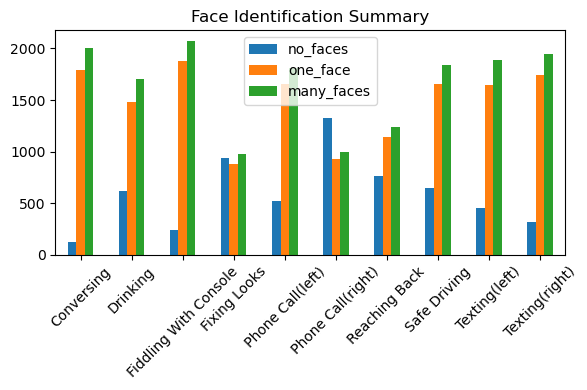

In [4]:
# Distribution of Face Identification
vizualizer.plot_faces_summary()

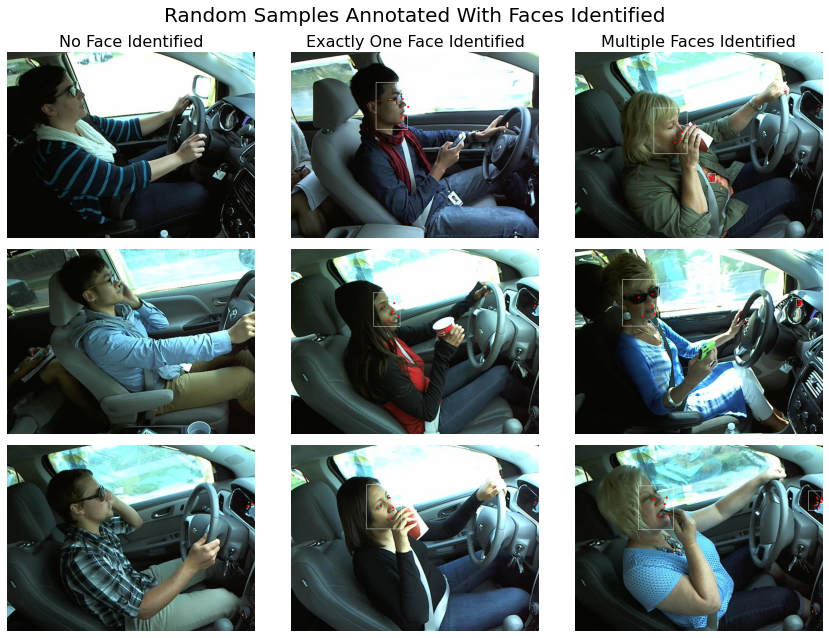

In [5]:
# Display the results of face detection.
vizualizer.display_faces(per_group_count = 3)

### Pose Extraction
The MoveNet model did a great job of finding poses in all our samples. However, the inference time was about 1 second per image on our limited computing resources. Hence we ran the MoveNet model on just the images for which the MTCNN identified exactly one face. Below is a vizualization of identified poses.

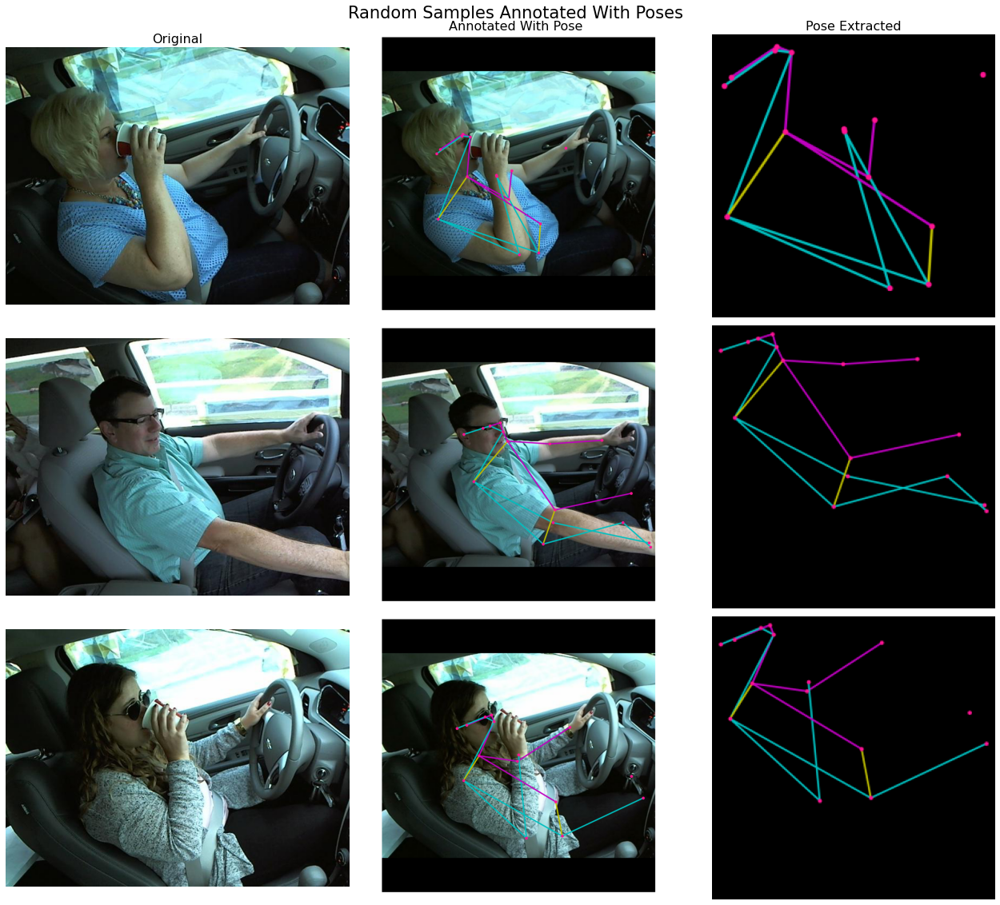

In [6]:
vizualizer.display_poses(rows=3)

### Standard Features
Once we had the face and pose extracted, we explored standard features such as Histogram of Oriented Gradients and Canny edges. We found that these feature vectors were too big and also too noisy to give us the required discriminatory power. Another biggest challenge we faced was that all these features needed image alignment. Hence we explored hand crafting features specific for our task.

### Custom Features - Keypoints Relative To Nose
One of the features we crafted was relative positions of key points. Since in almost all our classes, the nose is a stable point, we decided to use that as anchor and compute the relative positions of the 12 keypoints (eyes, ears, shoulders, elbows, wrists and hip) identified by the MoveNet model. We ignored knees and ankles as they too were similar across the classes. We found that these set of features were transformation invariant. Since the camera angle was fixed across all our training dataset, these features were also mostly scale invariant.

The below plot shows the distribution of relative positions of two of the keypoints, right and left wrists, across the 10 classes. We can see that the distributions are different for each class and hence the features have the discriminative power needed for our classification task. For example, median value of the right wrist y-coordinate is much lower in the reaching back class when compared to the rest. Another example is that for drinking and phone calling, the right wrist height is mostly aligned with the nose.


  0%|          | 0/5400 [00:00<?, ?it/s]

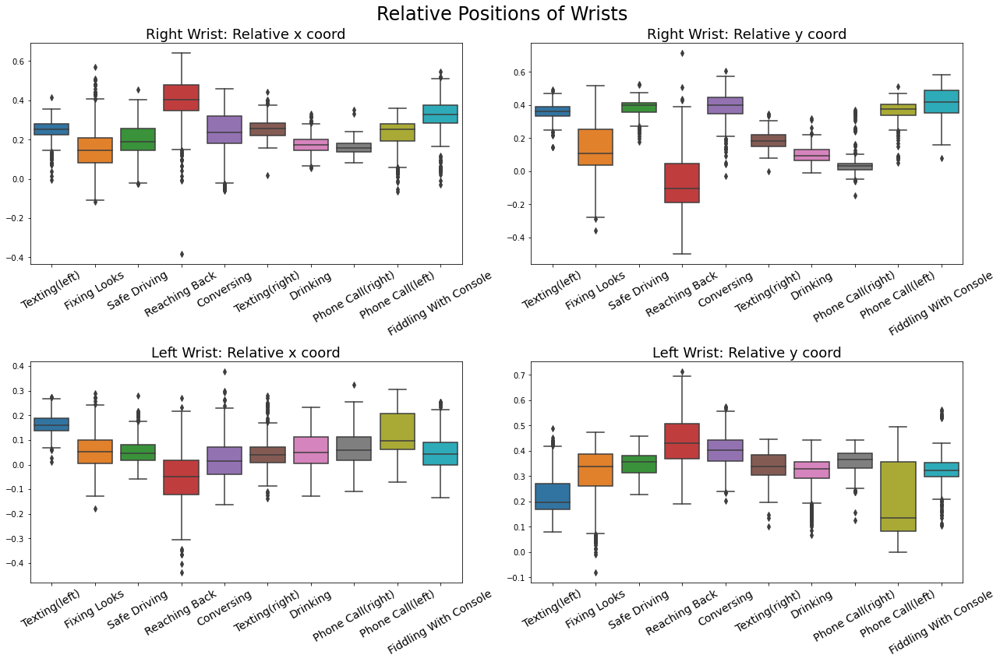

In [7]:
# Plot distribution of keypoint features distance
vizualizer.plot_keypoints_relative_positions()

### Custom Features - Orientation of Hands
We also noticed that in some of the classes, like phone call or fiddling with console, the angle between shoulder, elbow and wrist are distinct and hence can be leveraged. So we explored two related features - one was the angle between shoulders, elbow and wrist of each hand. Another was the direction that the hand is pointing at. 

We derived the hand orientation using Bodypix model. The bodypix model is a body segmentation model that identifies regions in the image with different parts of the body. We then estimated the center of the arms to find the arms’ location, fitted a straight line through the arms’ center and calculated the orientation of the arms by fitting a line using the least squares polynomial fit package (numpy.polyfit) through the area.

For the angle between shoulder, elbow and wrist, we calculated the angles between the three keypoints identified by the Movenet model.


Total no. rows: 6000, Rows with no nulls: 4903


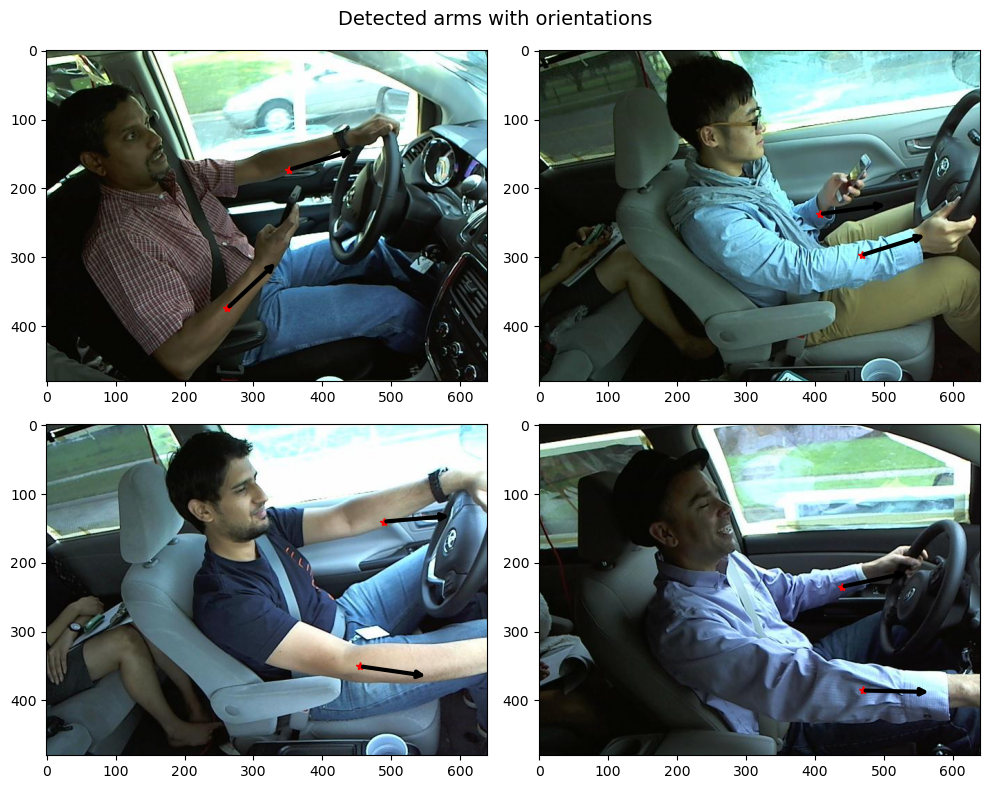

In [8]:
# Vizualize the center of arms and orientation of arms identified.
vizualizer.plot_bp_samples(features_csv='body_parts_feat.csv',
                           out_file='body_parts_sample.jpg')

Below box plots show the distribution of hand orientation as well as hand angles across the 10 classes. We can see distinguishable difference in angle and dispersion between class 0 (safe driving) and most of the other classes, especially for the right arm, which makes us believe that it is a useful feature. 
Angles of the left arm are less telling but in combination with the right are should generate good results.


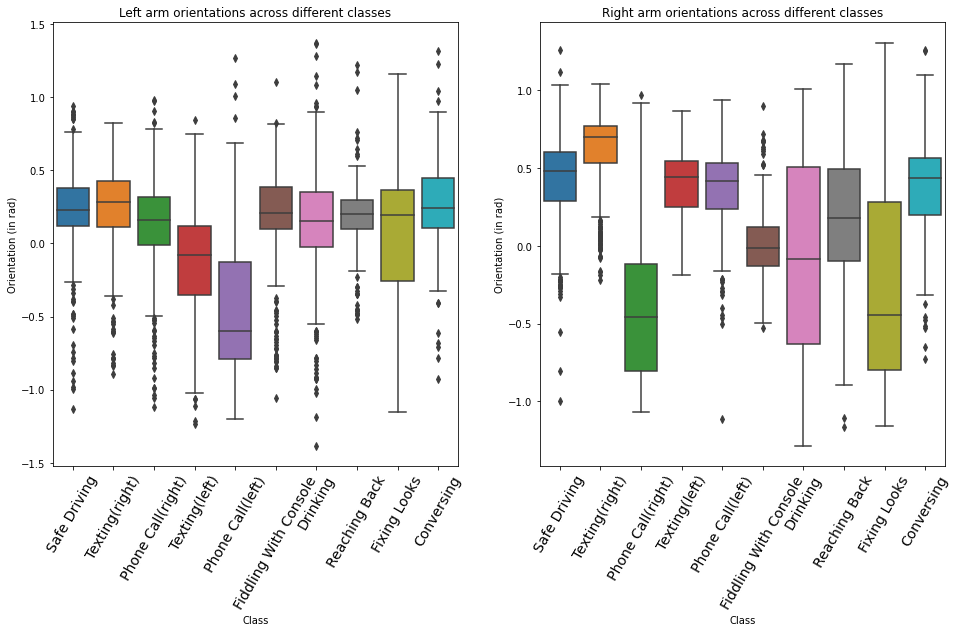

In [9]:
vizualizer.plot_body_parts_feature_distribution(
    features_csv='body_parts_feat.csv', 
    out_file='arm_orientation_distribution.jpg')

Loading 5400 samples:   0%|          | 0/5400 [00:00<?, ?samples/s]

Loading feature vectors:   0%|          | 0/5400 [00:00<?, ?images/s]

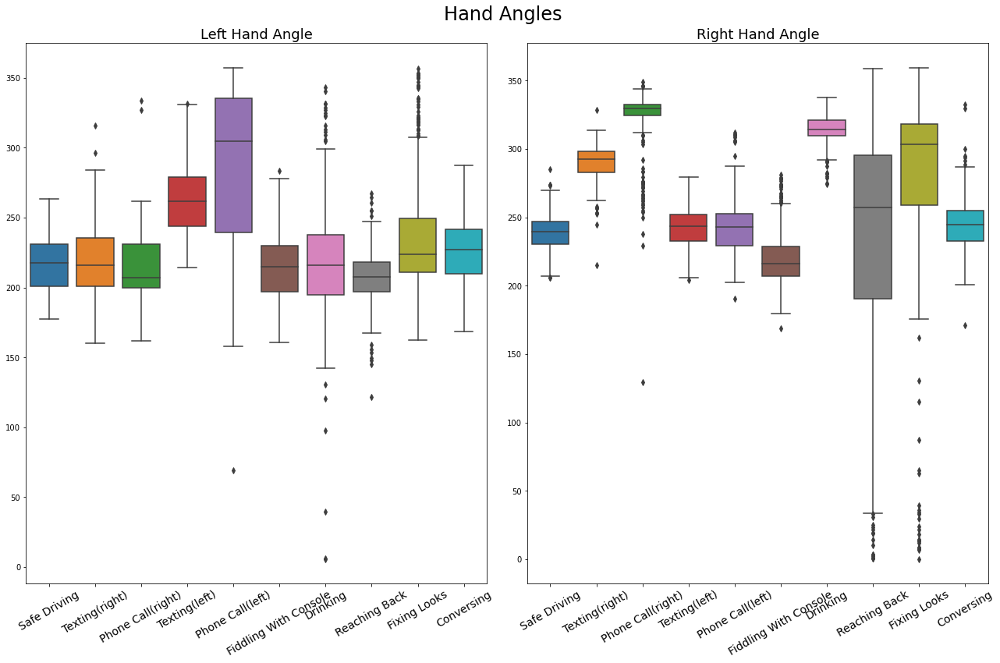

In [10]:
# Plot distribution of hand angles
vizualizer.plot_hand_angles()

#### Other Features
We also tried eyes detection, but it has a low coverages as many of the images have facial objects covering parts or entirity of the eyes (ex. Sunglasses)

In addition, we tried using CNN to extract features. With limited computational resources, the performance of this feature is also poor. Below is the summary and vizualization of the feature vectors extracted.

In [11]:
%%time
feature_extractor.summarize_features(IMAGE_TYPES)

Loading 6000 samples:   0%|          | 0/6000 [00:00<?, ?samples/s]

Loading feature vectors:   0%|          | 0/6000 [00:00<?, ?images/s]

Loaded 6000 samples.
hog_features:(6000, 5776), hog_features.min:0.0, hog_features.max:1.0
pixel_features:(6000, 25600), pixel_features.min:0.0, pixel_features.max:0.9999000430107117
cnn_features:(6000, 2048), cnn_features.min:0.0, cnn_features.max:1.6112374067306519
canny_features:(6000, 25600), canny_features.min:0, canny_features.max:255
pose_features:(6000, 65536), pose_features.min:0.0, pose_features.max:0.6640035510063171
keypoints_features:(6000, 26), keypoints_features.min:-0.5003660321235657, keypoints_features.max:0.9983551361863879

CPU times: user 30min 49s, sys: 2min 28s, total: 33min 17s
Wall time: 6min 6s


Loading 10 samples:   0%|          | 0/10 [00:00<?, ?samples/s]

Building HOG Features:   0%|          | 0/10 [00:00<?, ?images/s]

Building Edge Features:   0%|          | 0/10 [00:00<?, ?images/s]

Loading image:   0%|          | 0/52 [00:00<?, ?images/s]

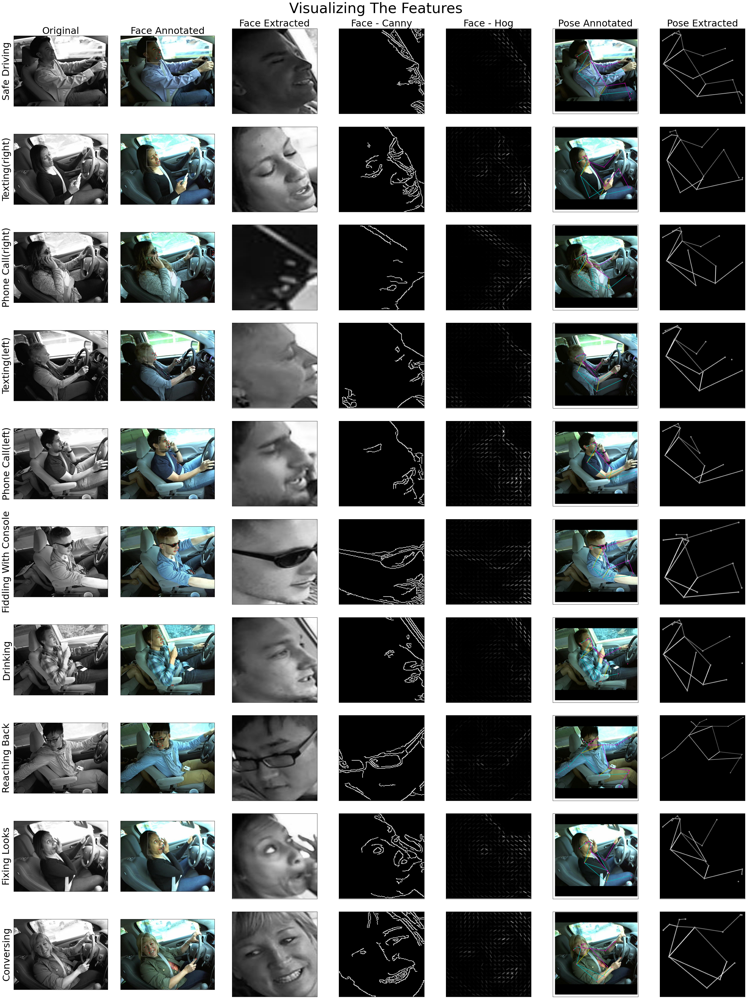

In [12]:
# Visualize features
vizualizer.plot_features(included_labels=config.class_dict.keys())

### Down Sampling And Splitting Dataset
Due to our limited computing resources, we could not use all the images for training. Hence we ended up randomly selecting 600 images per class for which the MTCNN identified exactly one face. We then separated this dataset of 6000 images into train, validation, and test data using a 80-10-10 split.


## Classification
This section covers feature selection, model building and the final analysis of model performance. First, we load the training and validation datasets (540 samples per class in total) for feature selection and model building. Later, we will load the test/holdout dataset (60 samples per class) for model performance analysis. This will ensure that our model training is not influenced by the held out dataset.

In [13]:
%%time

# Image types loaded: raw image pixels, pose annotated 
# images and faces extracted from image.
TRAIN_IMAGE_TYPES = [enums.ImageTypes.ORIGINAL, 
                     enums.ImageTypes.POSE_ANNOTATED, 
                     enums.ImageTypes.FACE]

# Features loaded: CNN, features extracted from pose 
# (KEYPOINTS feature has relative positions relative 
# to eyes as well as the hand angles)
TRAIN_FEATURES = [enums.FeatureType.CNN, 
                  enums.FeatureType.KEYPOINTS,
                  enums.FeatureType.HOG]

# Load the TRAIN_VALIDATION data. This loads the 
data = feature_extractor.load_data(image_types=TRAIN_IMAGE_TYPES, 
                                   labels=LABELS_TO_INCLUDE, 
                                   shuffle=True, 
                                   sample_type=enums.SampleType.TRAIN_VALIDATION,
                                   count_per_label=540,
                                   include_feature_vectors=False)
y = data[enums.DataColumn.LABEL.value]
train_idx, val_idx = train_test_split(np.arange(len(y)), 
                                      test_size=0.2, random_state=config.SEED)

# Load CNN and Keypoints features
all_features = feature_extractor.load_feature_vectors(
    config.FEATURE_VECTORS_FOLDER, 
    data[enums.DataColumn.FILENAME.value], 
    data[enums.DataColumn.LABEL.value],
    features=set(TRAIN_FEATURES))
[cnn_features, hog_features, keypoints_features, _, _] = all_features

Loading 5400 samples:   0%|          | 0/5400 [00:00<?, ?samples/s]

Loading feature vectors:   0%|          | 0/5400 [00:00<?, ?images/s]

CPU times: user 27min 49s, sys: 2min 10s, total: 29min 59s
Wall time: 5min 25s


In [14]:
# Summarize data and features loaded.
print(f'Loaded {data.shape[0]} samples with {data.columns} columns.')
print(f'cnn_features:{cnn_features.shape}, cnn_features.min:{np.min(cnn_features)}, cnn_features.max:{np.max(cnn_features)}')
print(f'keypoints_features:{keypoints_features.shape}, keypoints_features.min:{np.min(keypoints_features)}, keypoints_features.max:{np.max(keypoints_features)}')
print(f'hog_features:{hog_features.shape}, hog_features.min:{np.min(hog_features)}, hog_features.max:{np.max(hog_features)}')
print(f'Training dataset size: {len(train_idx)}; Validation dataset size: {len(val_idx)}')
print()

Loaded 5400 samples with Index(['filename', 'label', 'original', 'pose_annotated', 'face'], dtype='object') columns.
cnn_features:(5400, 5776), cnn_features.min:0.0, cnn_features.max:1.0
keypoints_features:(5400, 26), keypoints_features.min:-0.5003660321235657, keypoints_features.max:0.9983551361863879
hog_features:(5400, 2048), hog_features.min:0.0, hog_features.max:1.6112374067306519
Training dataset size: 4320; Validation dataset size: 1080



### Feature Selection
We did some basic analysis and did a first round of filtering of features, explained in below table.

Feature|Length|Status|Comment
-------|------|------|-------
Raw image pixels| 307,200 | Ignored| Too big and noisy
Raw face pixels| 25,600 | Ignored| Alignment is hard 
HoG of face | 5776 | Shortlisted| Alignment is hard 
Extracted body pose | 65,536 | Ignored| Aligned but still a little noisy 
Positions of eyes, ears, torso and hands relative to nose + angles made by each hand | 26 | Shortlisted| Extracted from the body pose, Translation invariant, least amount of noise, available for all images 
Orientation of each hand | 2 | Ignored | Available for 82% of training dataset. Ignored as we ran out of time.
Number of eyes detected | 1 | Ignored | Available for just 13% of training dataset
RestNet152 Featues | 2048 | Shortlisted | Large, available for all images

Next, we will do dimensionality reduction and anaysis on the three short listed features. Below plot shows both PCA and tSNE clustering for these 3 feature sets. We see that the top 16 pose components have close to 100% explainability while both HoG and CNN features are barely crossing 50% with 200 components. This is very understandable due to the very high dimensions of those two features. Thus the handcrafted pose based features are much superior and are also of much lower dimensions, making learning more efficient. However, pose based features are not perfect either. For example, “Reaching back” is well isolated but “Fixing look” is not. There is some overlap between “Texting” and “Phone call”.  


Doing PCA([200, 26, 200]):   0%|          | 0/3 [00:00<?, ?images/s]

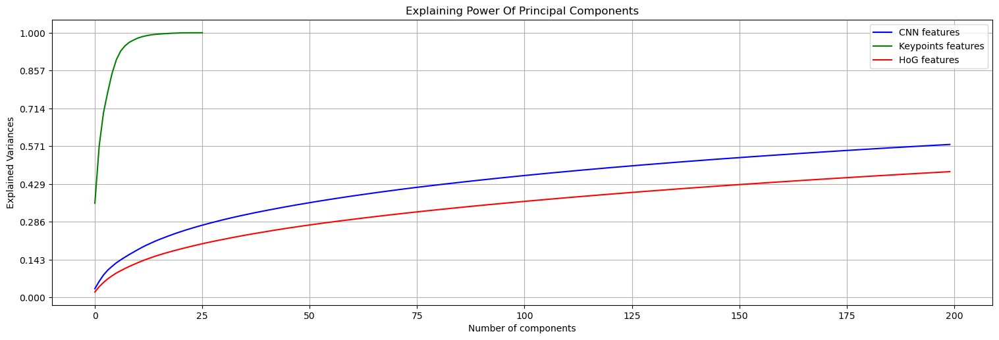

CPU times: user 8.82 s, sys: 330 ms, total: 9.15 s
Wall time: 2.12 s


In [15]:
%%time
vizualizer.plot_PCA(
    [cnn_features, keypoints_features, hog_features], 
    ['CNN', 'Keypoints', 'HoG'], 
    n_components=[200, 26, 200],
    max_components=200,
    out_file=f'pca_cnn_hog_keypoints.jpg')

Doing PCA([2, 2, 2]):   0%|          | 0/3 [00:00<?, ?images/s]

Doing tSNE(2):   0%|          | 0/3 [00:00<?, ?images/s]

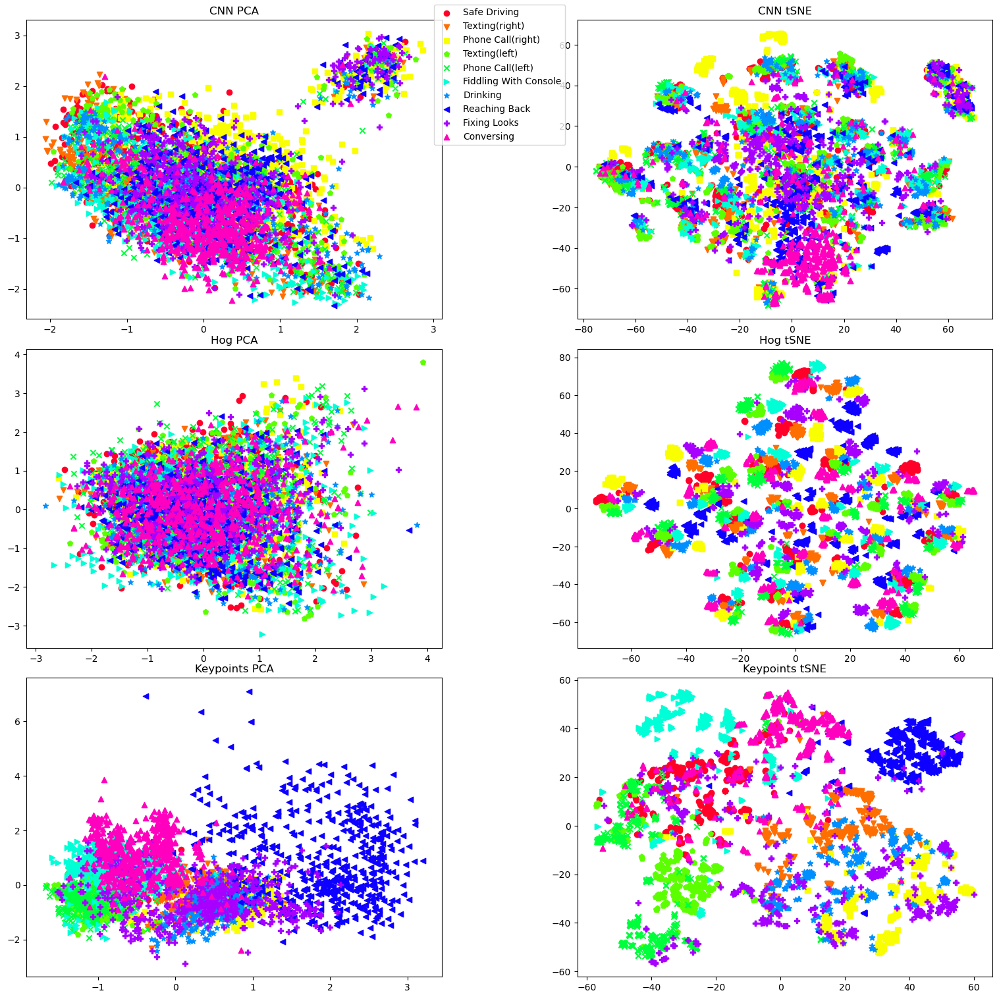

CPU times: user 4min 24s, sys: 5.2 s, total: 4min 29s
Wall time: 48.2 s


In [16]:
%%time
def visualize_components():
    features_list = [cnn_features, hog_features, keypoints_features]
    n_components = [2, 2, 2]
    names = ['CNN', 'Hog', 'Keypoints']
    pcas = feature_extractor.get_PCA(features_list, n_components)[-1]
    tsnes = feature_extractor.get_tsne(features_list, n_components=2)
    vizualizer.plot_components(features_list, y, pcas, tsnes, 
                               names, included_labels=LABELS_TO_INCLUDE)
visualize_components()

## Model Training
We decided to try out KNN, LogisticRegression, RandomForest and CNN models. The CNN model was trained with the raw image while all other models were trained on positions of eyes, ears, torso and hands relative to the nose plus the angles made by shoulder, elbow and wrist.
Below is the summary of all the models we tried. As can be seen, the KNN model was the best performing model (CNN was excluded in the comparison as we did not get to evaluating it against the held out dataset).

Model|Features|Parameters|Val. Accuracy|Holdout Accuracy|Tuning
-----|--------|----------|-------------|----------------|------
LogisticRegression|16 principal components of pose|Regularization: L1; Optimizer: Stochastic Average Gradient Accelerated (Saga) solver; Loss: Negative log loss; Regularization strength: 0.8303| 0.77 | 0.8 | Random grid search for regularization strength with CrossValidation of 5.
LogisticRegression|12 pose key points and 2 hand angles|Regularization: L1:Optimizer: Stochastic Average Gradient; Accelerated (Saga) solver; Loss: Negative log loss; Regularization strength: 9.745 | 0.81 | 0.84|Random grid search for regularization strength with CrossValidation of 5.
KNN*|14 principal components of pose|K=3|0.9|0.9|None
RandomForest|12 pose key points and 2 hand angles|Max depth: 13; Estimators: 140; Loss: Negative log loss|0.89|0.89|Hyperopt with CrossValidation of 5 for max depth and estimators.
CNN|Raw image | VGG16 backbone, pretrained weights and softmax activation head for classification.|0.95|-did not compute-|None

In the following sections we will dive into training of each model.






### KNN
Since the PCA indicated that a handful of principal components explain the variability well we decided to use a KNN with K=3. We did not get to tuning the K value.


In [17]:
%%time
model_runner = models.ModelRunner(config, face_config, 
                                  pose_config, tqdm)
model_runner.run_knn(keypoints_features, y, train_idx, 1000)

Doing PCA([14]):   0%|          | 0/1 [00:00<?, ?images/s]

Doing tSNE(2):   0%|          | 0/1 [00:00<?, ?images/s]

Accuracies from 1000 training samples:
Keypoints PCA Accuracy:  0.951
Keypoints tSNE Accuracy:  0.946
CPU times: user 1min 20s, sys: 1.71 s, total: 1min 22s
Wall time: 14.6 s


### Logistic Regression
With large data, logistic regression is one of the most efficient and effective classifiers since it has a relatively low computational complexity and high mathematically robustness. We decided to train two models - one trained with the top 16 principal components of features while the second was trained directly on the features. For both we used L1 regularization and Random grid search based hyper parameter tuning. Both models were fairly similar, with the one trained on the full set of features edging out the components based one. Below are the confusion matrices against the hold out dataset.


In [18]:
def logit_classifier(features, y, train_idx, val_idx, grid_params, 
                     feature_name, model_name, max_iter=5000, penalty='l1',
                     solver='saga', scoring='neg_log_loss'):
    # get the train and validation split
    X_train = features[train_idx, :].copy()
    y_train = y[train_idx].copy()
    X_val = features[val_idx, :].copy()
    y_val = y[val_idx].copy()

    # scaling
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_val = scaler.transform(X_val)

    # Save scaler for inference time use.
    scaler_file = f'{config.SAVED_MODELS_FOLDER}/scaler_{model_name}_{feature_name}.pkl'
    pickle.dump(scaler, open(scaler_file,'wb'))

    # classifier with cross validation
    clf = RandomizedSearchCV(LogisticRegression(
        penalty=penalty, solver=solver, random_state=config.SEED, 
        max_iter=max_iter), grid_params, return_train_score=True,
        scoring=scoring)
    clf = clf.fit(X_train, y_train)

    # Save the trained model for inference time.
    model_file = f'{config.SAVED_MODELS_FOLDER}/model_{model_name}_{feature_name}.pkl'
    pickle.dump(clf, open(model_file, 'wb'))
    
    y_pred = clf.predict(X_val)
    return clf, metrics.accuracy_score(y_val, y_pred)

def create_lr_keypoints_pca_model():
    n_components = 16
    # Parameter space for random search hyper parameter tuning.
    grid_params = {'C': loguniform(1e-2, 1e3)}

    # Random search of hyper parameters
    [keypoints_pca],[X_keypoints_pca] = feature_extractor.get_PCA(
        [keypoints_features], n_components=[n_components])
    print(len(X_keypoints_pca))
    
    #save the PCA for inference time use
    pca_file = f'{config.SAVED_MODELS_FOLDER}/model_pca_{n_components}_keypoints_pca.pkl'
    pickle.dump(keypoints_pca, 
                open(pca_file, 'wb'))
    logit_pca_clf, logit_pca_accuracy = logit_classifier(
        X_keypoints_pca, y, train_idx, val_idx, 
        grid_params, 'keypoints_pca', 'logistic')
    
def create_lr_keypoints_model():
    # Parameter space for random search hyper parameter tuning.
    grid_params = {
        'C': loguniform(1e-2, 1e3)}
    logit_pca_clf, logit_pca_accuracy = logit_classifier(
        keypoints_features, y, train_idx, val_idx, 
        grid_params, 'keypoints', 'logistic')


In [19]:
%%time

# Train the logistic regression model with 16 principal components of pose based features
create_lr_keypoints_pca_model()

Doing PCA([16]):   0%|          | 0/1 [00:00<?, ?images/s]

5400
CPU times: user 2min 9s, sys: 468 ms, total: 2min 9s
Wall time: 1min 19s


In [20]:
%%time

# Train the logistic regression model with the 26 pose based features
create_lr_keypoints_model()

/Users/rasentha/opt/anaconda3/envs/amd-gpu2/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/rasentha/opt/anaconda3/envs/amd-gpu2/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/rasentha/opt/anaconda3/envs/amd-gpu2/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/rasentha/opt/anaconda3/envs/amd-gpu2/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/rasentha/opt/anaconda3/envs/amd-gpu2/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_

CPU times: user 15min 22s, sys: 1.99 s, total: 15min 24s
Wall time: 14min 35s


### Random Forest
Random Forest is an algorithm that handles large feature sets well compared to parametric models since it is a non-linear and non-parametric model. With the capability to adjust certain hyperparameters (number of trees and max depth of the tree), it is possible to train Random Forest model computationally efficiently as well. In addition, Random Forest’s voting ensemble of bootstrapped random trees mechanism also provides a nice strength against overfitting. We trained 2 models also for Random Forest, one with different numbers of principal components, and the other with key points features.

For the hyperparameter tuning, we used the hyperopt package, which optimizes parameters based on the Bayes optimization technique, and cross validation of multiclass log-loss to tune for the best hyperparameter set for the number and depth of each random tree. Modeling results differed quite substantially. The one with PCA components did not perform too well as the number of components increased; however, the one with key points as feature set performed respectably with 92% accuracy in classifying each class correctly. Since the model was quite robust against overfitting, it showed stable performance at 88% accuracy in the test set as well.



In [21]:
%%time

def train_classifiers_with_hyperopt(in_feat, in_y, in_train_idx, 
                                    val_idx, feature_name):
    # get the train and validation split
    X_train = in_feat[in_train_idx, :].copy()
    y_train = in_y[in_train_idx].copy()
    X_val = in_feat[val_idx, :].copy()
    y_val = in_y[val_idx].copy()

    # scaling
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_val = scaler.transform(X_val)

    # classifier with cross validation
    best_dict = {}
    param_grid = {
        'random_forest': {
            'model': RandomForestClassifier,
            'params': {
                    'max_depth': 1 + hp.randint('max_depth', 20),
                    'n_estimators': 1 + hp.randint('n_estimators', 300),
                    'n_jobs': 4
            }
        }
    }
    # Optimize and output best hyperparameter set for each model
    best_dict = models.optimize(opt_dict = param_grid,
                         best_dict = best_dict,
                         X_train = X_train,
                         y_train = y_train,
                         max_evals = 100)
    
    clf_rf = RandomForestClassifier(random_state = config.SEED, 
                                    **best_dict['random_forest'])
    clf_rf = clf_rf.fit(X_train, y_train)
    y_pred_rf = clf_rf.predict(X_val)
    model_file = f'{config.SAVED_MODELS_FOLDER}/model_rf_{feature_name}.pkl'
    pickle.dump(clf_rf, open(model_file, 'wb'))    
    
    return metrics.accuracy_score(y_val, y_pred_rf), clf_rf

train_classifiers_with_hyperopt(keypoints_features, y, 
                                train_idx, val_idx, 'keypoints')

Optimizing random_forest model...
  3%|███▍                                                                                                                | 3/100 [00:08<04:44,  2.94s/trial, best loss: 0.41432493773938334]
Best hyperparameter set for random_forest is {'max_depth': 13, 'n_estimators': 140}


CPU times: user 3.59 s, sys: 1 s, total: 4.6 s
Wall time: 10.9 s


(0.8925925925925926,
 RandomForestClassifier(max_depth=13, n_estimators=140, random_state=42))

### Convolutional Neural Network
Given that CNNs do very good with image tasks, we wanted to try at least one CNN model. We found a Kaggle page where a VGG16 based model was used. Since we were out of time we just recreated that model and trained it. We also used the trained model in our iOS app as a proof of concept. Since this experiment was not taken to its logical conclusion, we did not fine tune or test the model against the validation dataset. We do not have a confusion matrix as well. Below is a screen shot from the iOS app.

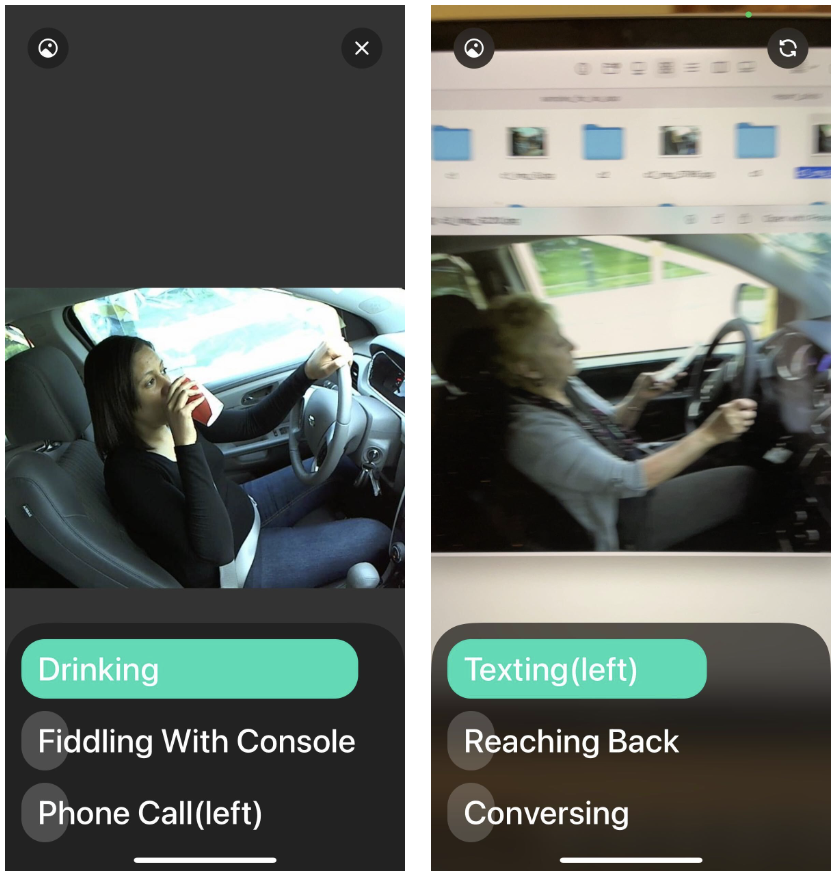

In [22]:
Image(filename = "images/ios_app.png",
      width = 400, height = 300)

In [25]:
def copy_images(location):
    # Copy TRAIN_TEST_VALIDATION images to separate folder for training the CNN model.
    dataset = customdataset.MainDataset(config, 
                                face_config,
                                pose_config,
                                sample_type=enums.SampleType.TRAIN_TEST_VALIDATION,
                                image_types=None, should_load_images=False)
    dataloader = DataLoader(dataset, num_workers=0, batch_size=1, 
                    shuffle=False, collate_fn=dataset.get_image_from)
    
    for samples in tqdm(dataloader, total=len(dataset), desc='Preparing training data'):
        _, cur_label, cur_filename = samples
        Path(f'{location}/c{cur_label}/').mkdir(parents=True, exist_ok=True)
        shutil.copyfile(f'{config.TRAIN_DATA}/c{cur_label}/{cur_filename}', 
                        f'{location}/c{cur_label}/{cur_filename}')

def train_model():
    weights_file = f'{config.INPUT_FOLDER}/vgg16-weights/vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5'
    # Create the network.
    vgg_model_raw = model_runner.load_VGG16(weights_file)
    vgg_model = vgg_model_raw.output
    vgg_model = Dense(5000, activation='relu',
                      kernel_regularizer=regularizers.l2(0.00001))(vgg_model)
    vgg_model = Dropout(0.1)(vgg_model)
    vgg_model = Dense(500, activation='relu',
                      kernel_regularizer=regularizers.l2(0.00001))(vgg_model)
    vgg_model = Dropout(0.1)(vgg_model)
    vgg_model = Dense(10, activation='softmax')(vgg_model)
    vgg_m = Model(inputs=vgg_model_raw.input, 
                  outputs= vgg_model)
    vgg_m.compile(loss='categorical_crossentropy', 
                  optimizer=keras.optimizers.SGD(0.001), 
                  metrics=['accuracy'])
    vgg_m.summary()

    # Load data
    TRAIN_DATA_LOC = f'{config.INPUT_FOLDER}/state-farm-distracted-driver-detection/imgs/train_cnn'
    copy_images(TRAIN_DATA_LOC)
    train_datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)    
    train_generator = train_datagen.flow_from_directory(
            TRAIN_DATA_LOC,
            target_size=(224, 224),
            batch_size=32,
            class_mode='categorical',
            subset='training')
    val_generator = train_datagen.flow_from_directory(
            TRAIN_DATA_LOC,
            target_size=(224,224),
            batch_size=32,
            class_mode='categorical',
            subset='validation')
    imgs, labels = next(train_generator)
    # Create output folder if its not there yet.
    Path(f'{config.OUTPUT_FOLDER}/vgg_model_tf_saved').mkdir(parents=True, exist_ok=True)
    checkpoint = ModelCheckpoint(f'{config.SAVED_MODELS_FOLDER}/vgg_model_tf_saved', 
                                 save_best_only=True, verbose=1)
    
    # Train the network
    history = vgg_m.fit(train_generator, steps_per_epoch=len(train_generator),
                       epochs=12,
                       validation_data = val_generator,
                       validation_steps=len(val_generator),
                       callbacks=[checkpoint])
    return vgg_m, history
vgg_m, cnn_history = train_model()

Weights have been loaded.
Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (Non

Preparing training data:   0%|          | 0/6000 [00:00<?, ?it/s]

Found 4800 images belonging to 10 classes.
Found 1200 images belonging to 10 classes.
Epoch 1/12
150/150 [==============================] - ETA: 0s - loss: 2.3253 - accuracy: 0.1013
Epoch 1: val_loss improved from inf to 2.31027, saving model to ./output/saved_models/vgg_model_tf_saved


150/150 [==============================] - 311s 2s/step - loss: 2.3253 - accuracy: 0.1013 - val_loss: 2.3103 - val_accuracy: 0.1550
Epoch 2/12
150/150 [==============================] - ETA: 0s - loss: 2.3061 - accuracy: 0.1450
Epoch 2: val_loss improved from 2.31027 to 2.29097, saving model to ./output/saved_models/vgg_model_tf_saved


150/150 [==============================] - 303s 2s/step - loss: 2.3061 - accuracy: 0.1450 - val_loss: 2.2910 - val_accuracy: 0.2508
Epoch 3/12
150/150 [==============================] - ETA: 0s - loss: 2.2822 - accuracy: 0.1823
Epoch 3: val_loss improved from 2.29097 to 2.25668, saving model to ./output/saved_models/vgg_model_tf_saved


150/150 [==============================] - 302s 2s/step - loss: 2.2822 - accuracy: 0.1823 - val_loss: 2.2567 - val_accuracy: 0.3175
Epoch 4/12
150/150 [==============================] - ETA: 0s - loss: 2.2180 - accuracy: 0.2667
Epoch 4: val_loss improved from 2.25668 to 2.11969, saving model to ./output/saved_models/vgg_model_tf_saved


150/150 [==============================] - 302s 2s/step - loss: 2.2180 - accuracy: 0.2667 - val_loss: 2.1197 - val_accuracy: 0.5117
Epoch 5/12
150/150 [==============================] - ETA: 0s - loss: 1.9104 - accuracy: 0.3840
Epoch 5: val_loss improved from 2.11969 to 2.05230, saving model to ./output/saved_models/vgg_model_tf_saved


150/150 [==============================] - 309s 2s/step - loss: 1.9104 - accuracy: 0.3840 - val_loss: 2.0523 - val_accuracy: 0.2175
Epoch 6/12
150/150 [==============================] - ETA: 0s - loss: 1.3674 - accuracy: 0.5652
Epoch 6: val_loss improved from 2.05230 to 0.98149, saving model to ./output/saved_models/vgg_model_tf_saved


150/150 [==============================] - 331s 2s/step - loss: 1.3674 - accuracy: 0.5652 - val_loss: 0.9815 - val_accuracy: 0.6758
Epoch 7/12
150/150 [==============================] - ETA: 0s - loss: 0.9914 - accuracy: 0.7152
Epoch 7: val_loss improved from 0.98149 to 0.59406, saving model to ./output/saved_models/vgg_model_tf_saved


150/150 [==============================] - 353s 2s/step - loss: 0.9914 - accuracy: 0.7152 - val_loss: 0.5941 - val_accuracy: 0.8225
Epoch 8/12
150/150 [==============================] - ETA: 0s - loss: 0.5731 - accuracy: 0.8310
Epoch 8: val_loss improved from 0.59406 to 0.39885, saving model to ./output/saved_models/vgg_model_tf_saved


150/150 [==============================] - 393s 3s/step - loss: 0.5731 - accuracy: 0.8310 - val_loss: 0.3988 - val_accuracy: 0.8867
Epoch 9/12
150/150 [==============================] - ETA: 0s - loss: 0.3781 - accuracy: 0.8873
Epoch 9: val_loss improved from 0.39885 to 0.28187, saving model to ./output/saved_models/vgg_model_tf_saved


150/150 [==============================] - 430s 3s/step - loss: 0.3781 - accuracy: 0.8873 - val_loss: 0.2819 - val_accuracy: 0.9200
Epoch 10/12
150/150 [==============================] - ETA: 0s - loss: 0.2799 - accuracy: 0.9206
Epoch 10: val_loss did not improve from 0.28187
150/150 [==============================] - 495s 3s/step - loss: 0.2799 - accuracy: 0.9206 - val_loss: 0.4226 - val_accuracy: 0.8642
Epoch 11/12
150/150 [==============================] - ETA: 0s - loss: 0.2184 - accuracy: 0.9417
Epoch 11: val_loss improved from 0.28187 to 0.19244, saving model to ./output/saved_models/vgg_model_tf_saved


150/150 [==============================] - 524s 3s/step - loss: 0.2184 - accuracy: 0.9417 - val_loss: 0.1924 - val_accuracy: 0.9400
Epoch 12/12
150/150 [==============================] - ETA: 0s - loss: 0.1826 - accuracy: 0.9546
Epoch 12: val_loss improved from 0.19244 to 0.18489, saving model to ./output/saved_models/vgg_model_tf_saved


150/150 [==============================] - 454s 3s/step - loss: 0.1826 - accuracy: 0.9546 - val_loss: 0.1849 - val_accuracy: 0.9467


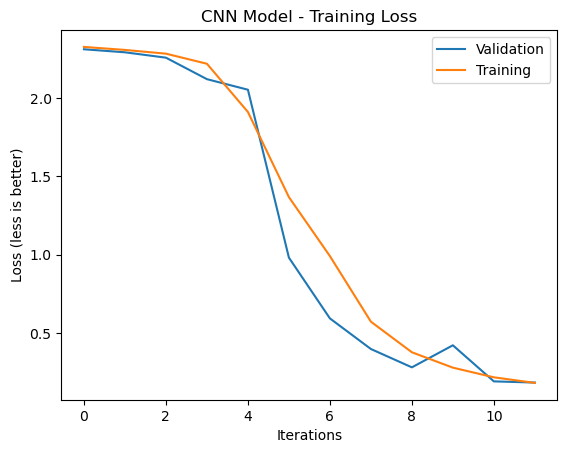

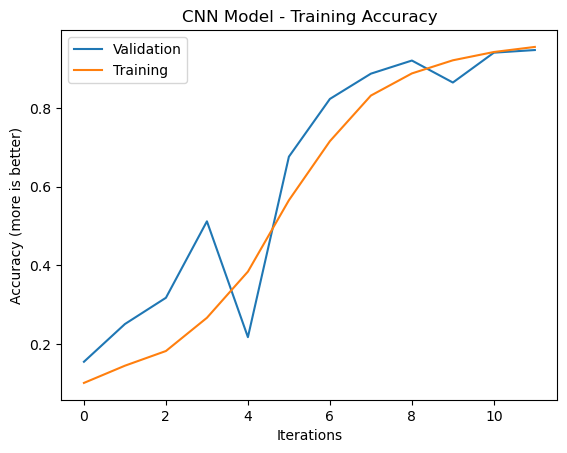

In [26]:
def plot_cnn_history(history):
    plt.plot(history.history['val_loss'], label='Validation')
    plt.plot(history.history['loss'], label='Training')
    plt.title('CNN Model - Training Loss')
    plt.xlabel('Iterations')
    plt.ylabel('Loss (less is better)')
    plt.legend()
    plt.show()
    plt.plot(history.history['val_accuracy'], label='Validation')
    plt.plot(history.history['accuracy'], label='Training')
    plt.title('CNN Model - Training Accuracy')
    plt.xlabel('Iterations')
    plt.ylabel('Accuracy (more is better)')
    plt.legend()
    plt.show()

plot_cnn_history(cnn_history)

In [27]:
# Convert the saved model to CoreML for inferencing within the iOS app.
model_runner.convert_tf_saved_model(
    f'{config.SAVED_MODELS_FOLDER}/vgg_model_tf_saved', 
    out_model_file=f'{config.OUTPUT_FOLDER}/DriverDistractionVggClassifier.mlmodel')

[INFO] converting model


Translating MIL ==> NeuralNetwork Ops: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████| 165/165 [00:01<00:00, 111.17 ops/s]


[INFO] saving model


## Analysis

### Performance Against Validation Dataset

KNN Using Keypoints PCA against Validation Dataset
Model Summary:
KNeighborsClassifier(n_neighbors=3)
Model Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.93      0.87       121
           1       0.88      0.95      0.91       113
           2       0.90      0.98      0.94       120
           3       0.89      0.96      0.93        97
           4       0.94      0.90      0.92       106
           5       0.93      0.95      0.94       104
           6       0.87      0.91      0.89       101
           7       0.98      0.96      0.97       110
           8       0.95      0.62      0.75       101
           9       0.92      0.85      0.88       107

    accuracy                           0.90      1080
   macro avg       0.91      0.90      0.90      1080
weighted avg       0.91      0.90      0.90      1080

Model Accuracy: 0.9037037037037037


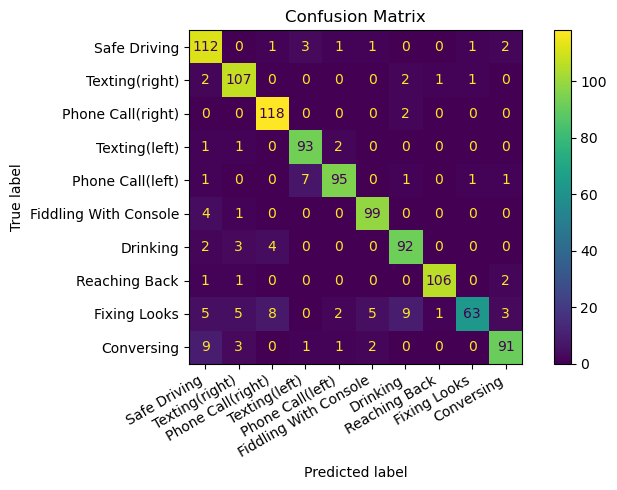

Logistic Regression Using Keypoints PCA against Validation Dataset
Model Summary:
RandomizedSearchCV(estimator=LogisticRegression(max_iter=5000, penalty='l1',
                                                random_state=42,
                                                solver='saga'),
                   param_distributions={'C': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x7f7133ca7580>},
                   return_train_score=True, scoring='neg_log_loss')
Best Parameters:
{'C': 0.8302802043463521}
Model Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.80      0.78       121
           1       0.85      0.85      0.85       113
           2       0.75      0.82      0.78       120
           3       0.71      0.75      0.73        97
           4       0.64      0.64      0.64       106
           5       0.90      0.86      0.88       104
           6       0.70      0.70      0.70       101
          

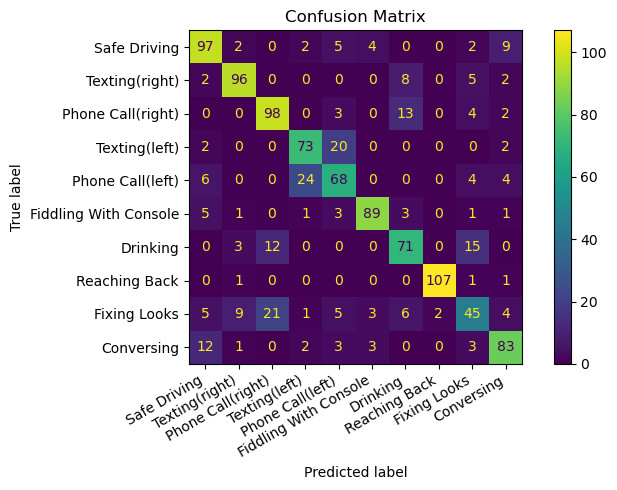

Logistic Regression Using Keypoints against Validation Dataset
Model Summary:
RandomizedSearchCV(estimator=LogisticRegression(max_iter=5000, penalty='l1',
                                                random_state=42,
                                                solver='saga'),
                   param_distributions={'C': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x7f7138e18e50>},
                   return_train_score=True, scoring='neg_log_loss')
Best Parameters:
{'C': 9.745086325354976}
Model Classification Report:
              precision    recall  f1-score   support

           0       0.78      0.78      0.78       121
           1       0.84      0.84      0.84       113
           2       0.81      0.87      0.84       120
           3       0.82      0.82      0.82        97
           4       0.76      0.80      0.78       106
           5       0.84      0.88      0.86       104
           6       0.79      0.71      0.75       101
           7   

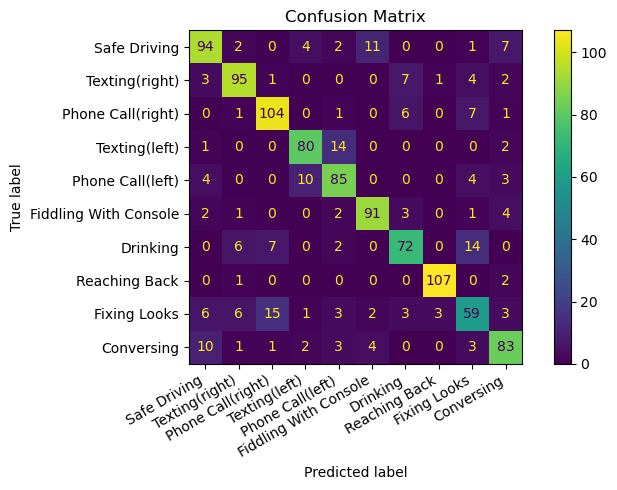

Random Forest Using Keypoints against Validation Dataset
Model Summary:
RandomForestClassifier(max_depth=13, n_estimators=140, random_state=42)
Model Classification Report:
              precision    recall  f1-score   support

           0       0.78      0.88      0.82       121
           1       0.93      0.97      0.95       113
           2       0.96      0.99      0.98       120
           3       0.87      0.93      0.90        97
           4       0.89      0.84      0.86       106
           5       0.88      0.94      0.91       104
           6       0.89      0.92      0.90       101
           7       0.96      0.99      0.98       110
           8       0.94      0.63      0.76       101
           9       0.86      0.80      0.83       107

    accuracy                           0.89      1080
   macro avg       0.90      0.89      0.89      1080
weighted avg       0.90      0.89      0.89      1080

Model Accuracy: 0.8925925925925926


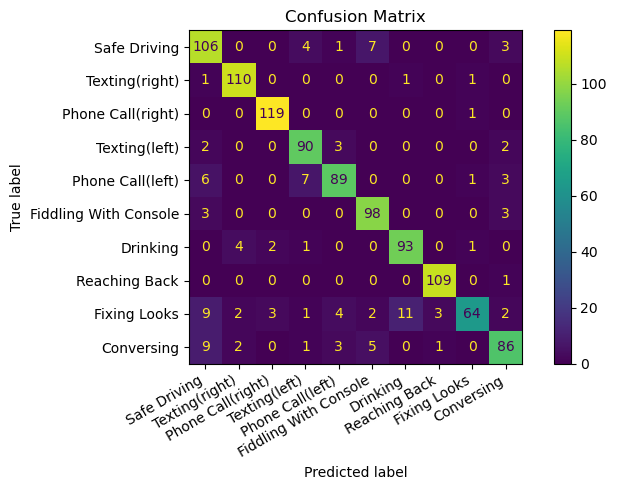

In [28]:
_ = model_analyzers.ModelSummarizer(config).evaluate_models_against(
    'Validation', keypoints_features[val_idx, :], y[val_idx])

### Performance Against Holdout Dataset

Loading 600 samples:   0%|          | 0/600 [00:00<?, ?samples/s]

Loading feature vectors:   0%|          | 0/600 [00:00<?, ?images/s]

KNN Using Keypoints PCA against Holdout Dataset
Model Summary:
KNeighborsClassifier(n_neighbors=3)
Model Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.95      0.90        60
           1       0.84      0.95      0.89        60
           2       0.87      0.98      0.92        60
           3       0.92      0.97      0.94        60
           4       0.87      0.88      0.88        60
           5       0.97      0.98      0.98        60
           6       0.85      0.88      0.87        60
           7       1.00      0.93      0.97        60
           8       0.87      0.57      0.69        60
           9       0.93      0.85      0.89        60

    accuracy                           0.90       600
   macro avg       0.90      0.89      0.89       600
weighted avg       0.90      0.90      0.89       600

Model Accuracy: 0.895


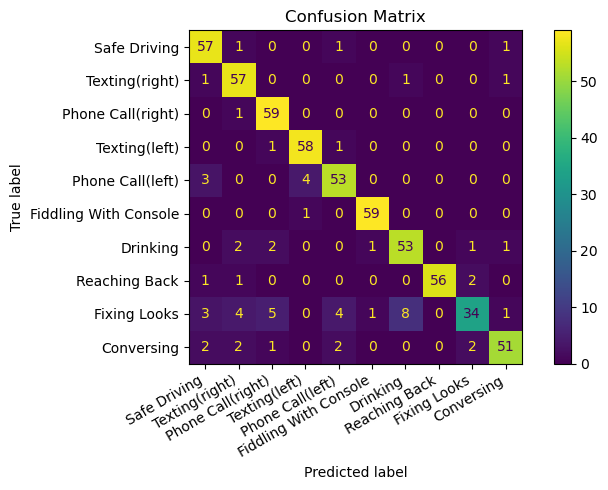

Logistic Regression Using Keypoints PCA against Holdout Dataset
Model Summary:
RandomizedSearchCV(estimator=LogisticRegression(max_iter=5000, penalty='l1',
                                                random_state=42,
                                                solver='saga'),
                   param_distributions={'C': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x7f7132c039a0>},
                   return_train_score=True, scoring='neg_log_loss')
Best Parameters:
{'C': 0.8302802043463521}
Model Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.80      0.75        60
           1       0.81      0.87      0.84        60
           2       0.81      0.85      0.83        60
           3       0.77      0.82      0.79        60
           4       0.72      0.73      0.73        60
           5       0.95      0.87      0.90        60
           6       0.73      0.75      0.74        60
           7 

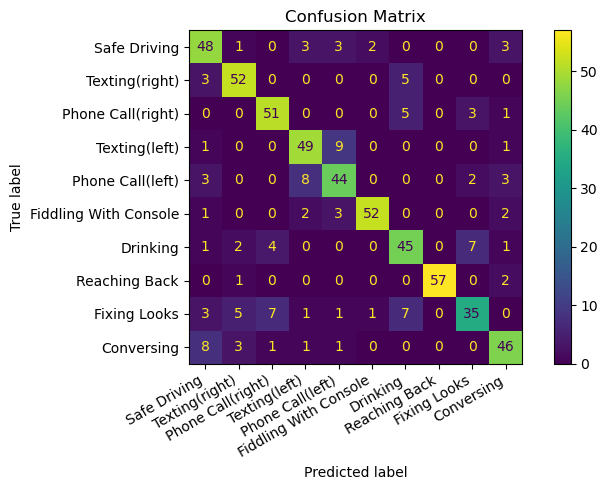

Logistic Regression Using Keypoints against Holdout Dataset
Model Summary:
RandomizedSearchCV(estimator=LogisticRegression(max_iter=5000, penalty='l1',
                                                random_state=42,
                                                solver='saga'),
                   param_distributions={'C': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x7f7131b47040>},
                   return_train_score=True, scoring='neg_log_loss')
Best Parameters:
{'C': 9.745086325354976}
Model Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.82      0.79        60
           1       0.84      0.93      0.88        60
           2       0.81      0.83      0.82        60
           3       0.88      0.93      0.90        60
           4       0.78      0.88      0.83        60
           5       0.91      0.88      0.90        60
           6       0.81      0.83      0.82        60
           7      

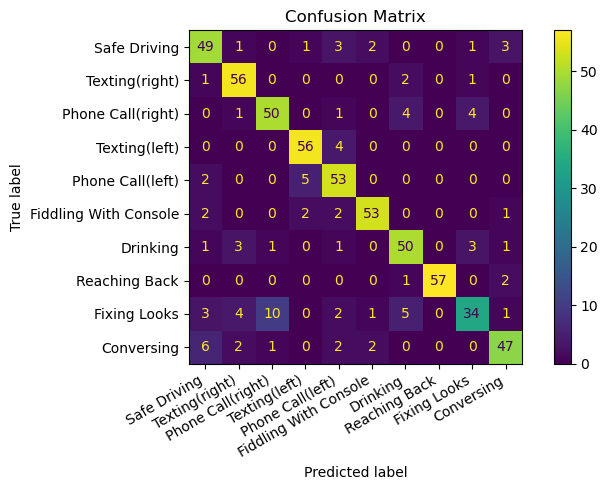

Random Forest Using Keypoints against Holdout Dataset
Model Summary:
RandomForestClassifier(max_depth=13, n_estimators=140, random_state=42)
Model Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.87      0.83        60
           1       0.84      0.97      0.90        60
           2       0.95      0.95      0.95        60
           3       0.91      0.98      0.94        60
           4       0.87      0.92      0.89        60
           5       0.97      0.93      0.95        60
           6       0.86      0.90      0.88        60
           7       1.00      0.97      0.98        60
           8       0.95      0.67      0.78        60
           9       0.84      0.78      0.81        60

    accuracy                           0.89       600
   macro avg       0.90      0.89      0.89       600
weighted avg       0.90      0.89      0.89       600

Model Accuracy: 0.8933333333333333


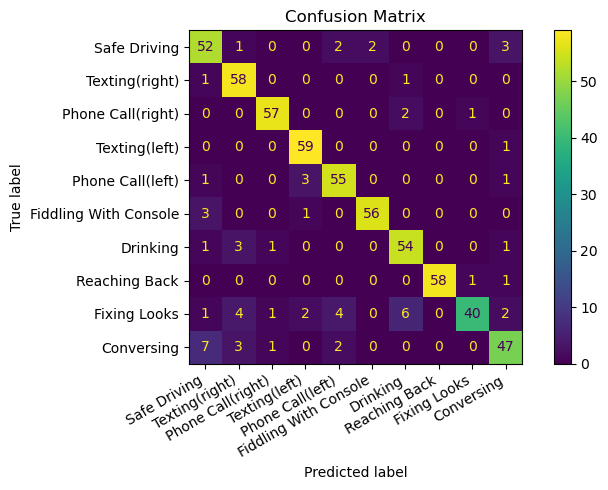

Saved


In [29]:
def display_misclassified_images(data_holdout, y_holdout, predictions_map):
    final_data = data_holdout[['filename', 'label']].copy()
    names = ['filename', 'truth']
    for name in predictions_map:
        final_data = np.append(final_data, predictions_map[name][0].reshape(-1, 1), 1)
        names.append(name)    
    
    final_data_pd = pd.DataFrame(final_data, columns=names)
    final_data_pd.to_csv(f'{config.OUTPUT_FOLDER}/final_predictions_heldout_dataset.csv')
    print('Saved')
    
def test_models_against_holdout():
    data_holdout = feature_extractor.load_data(image_types=TRAIN_IMAGE_TYPES,
                                   labels=LABELS_TO_INCLUDE,
                                   shuffle=True, 
                                   sample_type=enums.SampleType.TEST,
                                   include_feature_vectors=False)
    y_holdout = data_holdout[enums.DataColumn.LABEL.value]

    # Load CNN and Keypoints features
    all_features = feature_extractor.load_feature_vectors(
        config.FEATURE_VECTORS_FOLDER, 
        data_holdout[enums.DataColumn.FILENAME.value], 
        data_holdout[enums.DataColumn.LABEL.value],
        features=set(TRAIN_FEATURES))
    [holdout_cnn_features, _, holdout_keypoints_features, _, _] = all_features
    model_summarizer = model_analyzers.ModelSummarizer(config)
    predictions_map = model_summarizer.evaluate_models_against(
        'Holdout',
        holdout_keypoints_features,
        y_holdout)
    # summary = model_summarizer.generate_sumamry(predictions_map)
    display_misclassified_images(data_holdout, y_holdout, predictions_map)

test_models_against_holdout()

We can see below some examples of misclassified images:

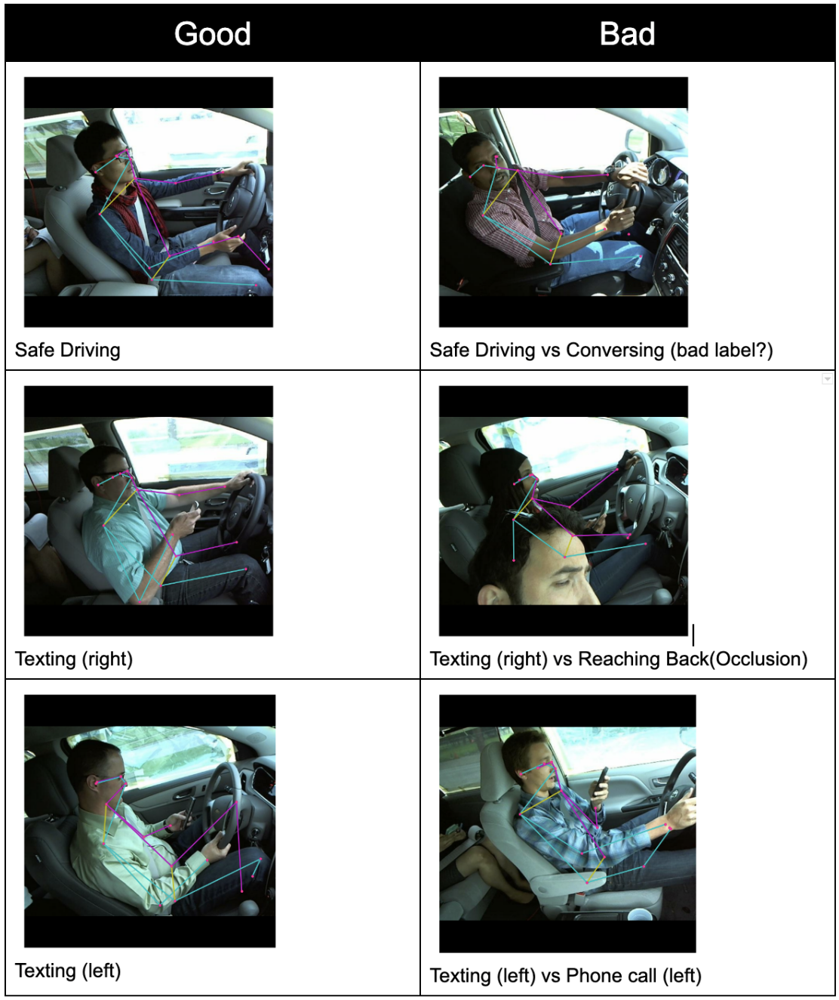

In [30]:
Image(filename = "images/final_analysis.png",
      width = 600, height = 300)

## Lesson Learned and Future Improvements

### Noise in Data
During EDA we noticed that some of the images are misclassified. It appears that the underlying data collection mechanism was to record a video of some driving and taking snapshots from the view at some frequency. The original label was applied on the video segment and not on the individual images. So there are stills where the driver is looking straight and driving safely but then it came from the video segment where the driver was conversing and hence is labeled wrong. We can do another round with a manual relabelling of the 22,000 images.

### Data Augmentation
The camera angle of all of the data is from the point of view of a passenger holding a hand camera. In order to generalize the model better, we should generate more images from more angles. We saw the limitation of the current model while using the iOS application in a real life situation.
Also, our model is dependent on the performance of the Movenet model in identifying poses. Movenet model is not doing a good job all the time in our case as our use is overwhelmingly of users sitting and side profiles. It will be worth generating training data for our specific use case by annotating the training dataset with pose and keypoints, use that to do transfer learning. In fact, our intuition is that a cross trained CNN with Movenet’s back backbone and a 10-class head will do better.
We also have some images where glasses, head gear, hair etc hide the face. We will also need more images with such variations to train the model better.

### Additional Features
The confusion matrices show that the “Fixing looks” class is one that all models get wrong the most. As we saw earlier, this is also obvious in the tSNE clustering plot above, where the images for class “Fixing Looks” are not as well isolated as the other classes. Further, confusion matrices also show that “Fixing Look” is most often confused with “Phone call right” and “Drinking”. This too makes sense as in all three cases the hands are folded in a similar fashion. We think that if we add another feature to identify if the hand is holding something using an object detection model then we can improve this part. There is also some confusion between texting and calling. We think that another feature identifying the gaze direction can help.

### Practical Applications
We trained the models with log loss but our final metrics are accuracy. In order to put this model to a practical use in a real world setting, we need to take the class probabilities into consideration as well. We think that the scores will drop if we switch to log probabilities. However we ran out of time to check on that. Also, since the training data was from a handheld camera, the model did poorly when test driven with the app running on a dashboard mounted phone. Needs more work to generalize the model to handle such more practical use cases.

### Other Considerations
Logistic regression assumes independence and our features are not perfectly independent. For example, the relative position features could be correlated with the arm angle feature. We have not explored this aspect and impact of such correlation. Arguably, the PCA done should have covered this part but doing a pairwise correlation study would be best. We ran out of time for that.

We did not do any explicit bias variance trade-off analysis.


## References
<span id="cite_cdc" width="80%">1. [Distracted Driving | Transportation Safety | Injury Center](https://www.cdc.gov/transportationsafety/distracted_driving/index.html?CDC_AA_refVal=https%3A%2F%2Fwww.cdc.gov%2Fmotorvehiclesafety%2Fdistracted_driving%2Findex.html) n.d. CDC. Accessed October 9, 2022.</span>
 
<span id="cite_mtcnn" width="80%">2. X. He, P. Wang, Z. Zhao, Y. Zhao and F. Su, "MTCNN with Weighted Loss Penalty and Adaptive Threshold Learning for Facial Attribute Prediction," 2019 IEEE International Conference on Multimedia & Expo Workshops (ICMEW), 2019, pp. 180-185, doi: 10.1109/ICMEW.2019.00-90.</span>

<span id="cite_mobilenet" width="80%">3. Sandler, M., Howard, A., Zhu, M., et al. (2018) Mobilenetv2: Inverted Residuals and Linear Bottlenecks. Proceedings of the IEEE Conference on Computer Vision and Pattern Recognition, Salt Lake City, 18-23 June 2018, 4510-4520.
https://doi.org/10.1109/CVPR.2018.00474</span>
 